# Image Compression using Principal Component Analysis 

In this project, we are exploring the concept of image compression using Principal Component Analysis (PCA). We begin by loading a sample image and applying PCA to reduce its dimensionality while retaining essential features. Through visualizations, we showcase the trade-off between compression and information loss, with the 'explained variance' plot illustrating the cumulative proportion of total image variance captured by each principal component. By reconstructing the image using a reduced number of components, we demonstrate how PCA can achieve efficient data representation and storage. This project offers a hands-on understanding of dimensionality reduction techniques in image processing and their application to achieve effective image compression.

## Imports

In [93]:
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.decomposition import PCA
from skimage import data, metrics

## Load image

Load the sample image...

In [94]:
camera_image = data.camera()

...and display it

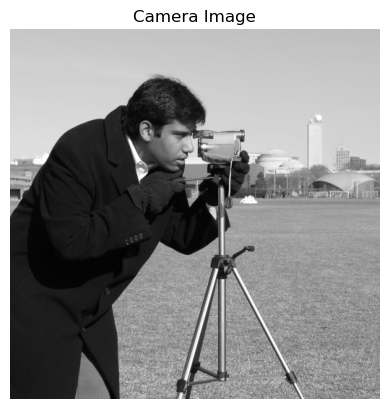

In [95]:
plt.imshow(camera_image, cmap='gray')
plt.title('Camera Image')
plt.axis('off')
plt.show()

## Principal Component Analysis

We want to apply PCA for three different n_components values. 

In [96]:
num_components_values = [20, 50, 100]

Display reconstructed images for different num_components values, along with their  Structural Similarity Index (SSI) to the original image. SSI quantifies the similarity between the original image and the reconstructed image.

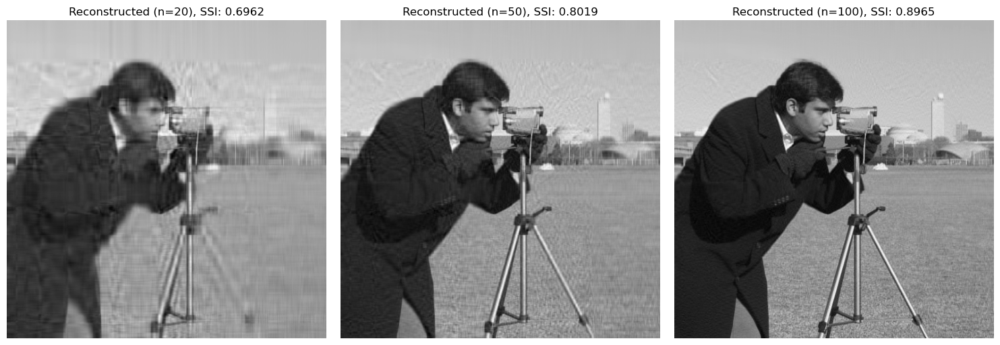

In [97]:
plt.figure(figsize=(15, 15))

for idx, num_components in enumerate(num_components_values, 1):
    # Apply PCA
    pca = PCA(n_components=num_components) 
    image_pca = pca.fit_transform(camera_image) 

    # Reconstruct the image
    image_reconstructed = pca.inverse_transform(image_pca) 
    
    # Calculate Structural Similarity Index (SSI)
    ssi = metrics.structural_similarity(camera_image, image_reconstructed, data_range=image_reconstructed.max() - image_reconstructed.min())

    # Display the reconstructed image
    plt.subplot(3, 3, idx)
    plt.imshow(image_reconstructed, cmap='gray')
    plt.title(f'Reconstructed (n={num_components}), SSI: {ssi:.4f}')
    plt.axis('off')

plt.tight_layout()
plt.show()

### Explained Variance

Display the cumulative explained variance captured by each principal component. It shows the cumulative sum of the explained variance ratios as the number of principal components increases. This plot helps us understand how well the compression retains the original image's information. A steeper slope indicates that a few principal components capture most of the image's information.

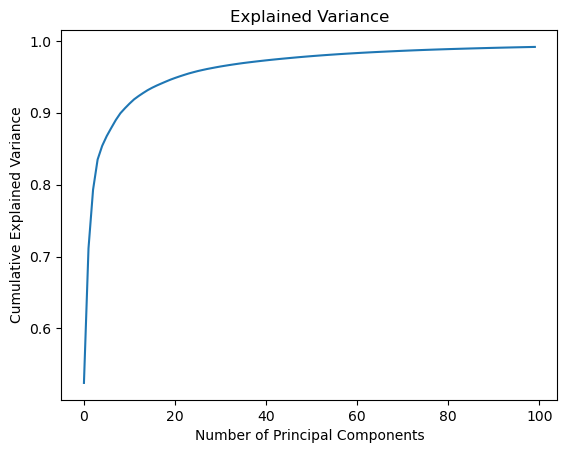

In [98]:
pca = PCA(n_components=max(num_components_values))
image_pca = pca.fit_transform(camera_image)
plt.plot(np.cumsum(pca.explained_variance_ratio_))
plt.xlabel('Number of Principal Components')
plt.ylabel('Cumulative Explained Variance')
plt.title('Explained Variance')
plt.show()

### PCA Heatmap

PCA heatmap that visually represents the significance of each pixel in contributing to the variance captured by the principal components.

Get the principal components and their weights

In [100]:
principal_components = pca.components_
explained_variances = pca.explained_variance_ratio_

Plot PCA Heatmap

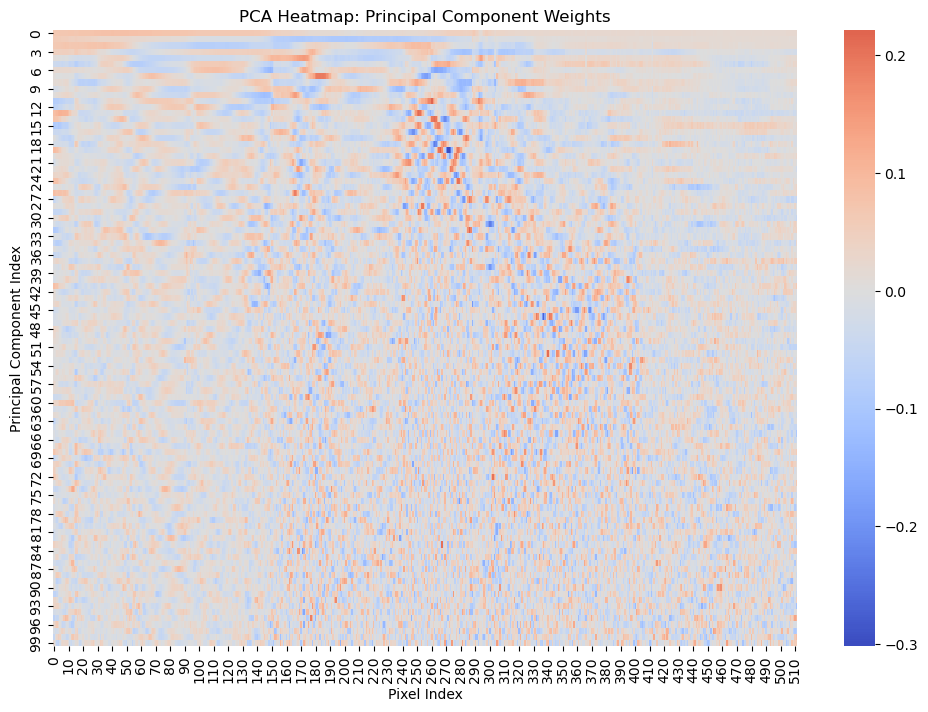

In [101]:
plt.figure(figsize=(12, 8))
sns.heatmap(principal_components, cmap='coolwarm', center=0)
plt.xlabel('Pixel Index')
plt.ylabel('Principal Component Index')
plt.title('PCA Heatmap: Principal Component Weights')
plt.show()